# Overview


**This notebook explores various Image Processing Techniques like:**

*   Converting Image to Gray Scale
*   Applying Gaussian Smoothing and Bilateral Filter
*   Generating Masks of the objects using some Morphological Techniques like Erosion, Dilation, Opening and Closing
*   Using Sobel Filter and Canny Edge Detector to detect Edges
*   Using Hough Circle Transform to detect circular objects from the image
*   Detect an object using Template Matching
*   Flipping the position of the object and changing its color
*   Detecting Face and Eyes using HAAR Cascade
*   Changing Background in the image
*   Replacing the object with another image
*   Sharpening the image using Unsharp Masking













In [133]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline


### Read Sample Video

In [134]:
%cd '/content'
# Create a VideoCapture object
cap = cv2.VideoCapture('sample_video.mp4')

if (cap.isOpened() == False): 
  print("Unable to read camera feed")

/content


### Set Configurations like Frame Rate etc

In [135]:
# Default resolutions of the frame are obtained.The default resolutions are system dependent.
# We convert the resolutions from float to integer.
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
# output_video_file = 'outpy.avi'
output_video_file = 'output.mp4'
frame_rate = 20
pos = 0


In [136]:
# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
# out = cv2.VideoWriter('output.avi', -1, 20.0, (640,480))
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_file,fourcc, frame_rate, (frame_width,frame_height))
# out = cv2.VideoWriter(output_video_file,cv2.VideoWriter_fourcc('M','J','P','G'), frame_rate, (frame_width,frame_height))
# out = cv2.VideoWriter("output.mp4",cv2.VideoWriter_fourcc(*"MJPG"), 30,(640,480))

In [137]:
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print('Frame count:', frame_count)

cap.set(cv2.CAP_PROP_POS_FRAMES, 500)
print('Position:', int(cap.get(cv2.CAP_PROP_POS_FRAMES)))

frame_array = []
fontScale = 0.8
  # (B, G, R)
fontColor = (0, 0, 255)
fontFace = cv2.FONT_HERSHEY_TRIPLEX

face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

Frame count: 2365
Position: 500


### Define Utility Methods

In [138]:
def grayscale(frame):
  text = "Gray scale"
  gray_color = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  gray_color = cv2.cvtColor(gray_color, cv2.COLOR_GRAY2BGR)
  frame = gray_color
  cv2.putText(img = frame, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return frame

def gaussian_smoothing(img):
   text = "Gaussian Smoothing"
   dst = cv2.GaussianBlur(img,(11,11), cv2.BORDER_DEFAULT)
   img = dst
   cv2.putText(img = img, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
   return img

def bilateral_filter(frame):
  text = "Bilateral filter"
  # Apply bilateral filter with d = 15,  
  # sigmaColor = sigmaSpace = 75. 
  bilateral = cv2.bilateralFilter(frame, 15, 75, 75)
  frame = bilateral
  cv2.putText(img = frame, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return frame



In [139]:
def gen_mask(frame):
  text = "Generating Mask"
  hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV) 
  lower_yellow = np.array([20,50,50])
  upper_yellow = np.array([80,255,255])
  # Threshold the HSV image to get only yellow colors
  mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
  return mask

def op_erosion(mask):
  kernel = np.ones((5,5),np.uint8)
  return cv2.erode(mask,kernel,iterations = 1)

def op_dilation(mask):
  kernel = np.ones((5,5),np.uint8)
  return cv2.dilate(mask,kernel,iterations = 1)

def op_opening(mask):
  kernel = np.ones((5,5),np.uint8)
  return cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

def op_closing(mask):
  kernel = np.ones((5,5),np.uint8)
  return cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

def morphological_operations(frame):
  mask = gen_mask(frame)
  erosion = op_erosion(mask)
  mask = erosion
  dilation = op_dilation(mask)
  mask = dilation
  opening = op_opening(mask)
  mask = opening
  closing = op_closing(mask)
  mask = closing
  return mask

def grabbing_object(frame):
  bilateral = bilateral_filter(frame)
  dst = gaussian_smoothing(frame)
  text = "Grabbing Object"
  frame = bilateral
  mask = morphological_operations(frame)
  # Bitwise-AND mask and original image
  res = cv2.bitwise_and(frame,frame, mask= mask)
  cv2.putText(img = res, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return res

In [140]:
def face_detection(img, with_eyes=False):
  text = "Face and Eye Detection"
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)
  for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    if (with_eyes):
      eyes = eye_cascade.detectMultiScale(roi_gray, scaleFactor = 1.5, minNeighbors = 5)
      for (ex,ey,ew,eh) in eyes:
          cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
  cv2.putText(img = img, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return img


def flip_and_change_color(frame):
  text = "Flip image and change color of object"
  fontScale = 0.5
  img = frame.copy()
  img  = np.flip(img, 1)
  #creating an inverted mask to segment out the object from the frame
  mask = morphological_operations(img)
  mask2 = cv2.bitwise_not(mask)

  #Segmenting the object out of the frame using bitwise and with the inverted mask
  res1 = cv2.bitwise_and(img,img,mask=mask2)

  # creating image showing static background frame pixels only for the masked region
  res2 = cv2.bitwise_and(img, img, mask = mask)
  res3 = cv2.bitwise_and(frame, frame, mask = mask2)

  blue, green, red = cv2.split(res2)
  zeros = np.zeros(blue.shape, np.uint8)
  blueBGR = cv2.merge((blue,zeros,zeros))
  blueBGR = res2
  blueBGR[mask>0]=(153,52,235)
  #Generating the final output
  final_output = cv2.addWeighted(blueBGR,1,res3,1,0)
  cv2.putText(img = final_output, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return final_output



In [141]:
def adding_image_on_object(frame, second_img, text):
  original = frame.copy()
  # Threshold the HSV image to get only yellow colors
  mask = morphological_operations(frame)
  contours = cv2.findContours(mask.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
  mask2 = cv2.bitwise_not(mask)
  res1 = cv2.bitwise_and(frame,frame,mask=mask)
  res2 = cv2.bitwise_and(frame, frame, mask = mask2)

  if len(contours)>0:
      yellow_area = max(contours, key=cv2.contourArea)
      (xg,yg,wg,hg) = cv2.boundingRect(yellow_area)
      # cv2.rectangle(frame,(xg,yg),(xg+wg, yg+hg),(0,255,0),2)
      #calculate the 50 percent of original dimensions
      scale_percent = 100
      wg = int(wg * scale_percent / 100) 
      hg = int(hg * scale_percent / 100) 

      # dsize
      dsize = (wg, hg)
      output = cv2.resize(src, dsize)
      orig = frame
      background = np.asarray(orig)
      endY = yg + hg
      endX = xg + wg
      res2_copy = res2.copy()
      res2[yg: endY, xg: endX] = output
      add_weighted2 = cv2.addWeighted(res2, 1, res2_copy, 1, 0)
      resabs = cv2.bitwise_and(add_weighted2,add_weighted2,mask=mask)
      resabs2 = cv2.addWeighted(resabs, 1, res2_copy, 1, 0)
      final_output = res2
      # final_output = resabs2
      cv2.putText(img = final_output, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
      return final_output

def canny_edge_detection(frame):
  edges = cv2.Canny(frame,100,200)
  return edges

def sobel_filter(frame, method, kernel_size):
  meth = eval(method)
  sobel = meth(frame, kernel_size)
  abs_sobel64f = np.absolute(sobel)
  sobel_8u = np.uint8(abs_sobel64f)
  return sobel_8u

def sobel_x(frame, kernel_size):
  # Sobel X
  if (kernel_size == 3):
    # color blue
    frame[:, :, 1] = 0
    frame[:, :, 2] = 0
  else:
    # color green
    frame[:, :, 0] = 0
    frame[:, :, 2] = 0
  text = "Sobel X horizontal kernel "+str(kernel_size)
  sobel = cv2.Sobel(frame,cv2.CV_64F,1,0,ksize=kernel_size)
  cv2.putText(img = sobel, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return sobel

def sobel_y(frame, kernel_size):
   # Sobel Y
  if (kernel_size == 3):
  # color red
    frame[:, :, 0] = 0
    frame[:, :, 1] = 0
  else:
    # color green
    frame[:, :, 0] = 0
    frame[:, :, 2] = 0
  text = "Sobel Y vertical kernel "+str(kernel_size)
  sobel = cv2.Sobel(frame,cv2.CV_64F,0,1,ksize=kernel_size)
  cv2.putText(img = sobel, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return sobel

In [142]:
def detect_object(frame):
  text = "Contours"
  # Convert BGR to HSV
  hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
  # define range of blue color in HSV
  lower_yellow = np.array([20,50,50])
  upper_yellow = np.array([80,255,255])
  # Threshold the HSV image to get only blue colors
  mask = cv2.inRange (hsv, lower_yellow, upper_yellow)
  contours = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]

  if len(contours)>0:
      yellow_area = max(contours, key=cv2.contourArea)
      (xg,yg,wg,hg) = cv2.boundingRect(yellow_area)
      cv2.rectangle(frame,(xg,yg),(xg+wg, yg+hg),(0,255,0),2)
  cv2.putText(img = frame, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return frame

def match_template(frame, template):
  text = "Template Matching"
  img2 = frame
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
  template = cv2.Canny(template, 50, 200)
  w, h = template.shape[::-1]
  found = None    
  # loop over the scales of the image
  for scale in np.linspace(0.2, 1.0, 20)[::-1]:
    # resize the image according to the scale, and keep track
    # of the ratio of the resizing
    resized = cv2.resize(img2, (int(img2.shape[1] * scale), int(img2.shape[0] * scale)))
    r = img2.shape[1] / float(resized.shape[1])
    # if the resized image is smaller than the template, then break
    # from the loop
    if resized.shape[0] < h or resized.shape[1] < w:
      break
    # detect edges in the resized, grayscale image and apply template
    # matching to find the template in the image
    edged = cv2.Canny(resized, 50, 200)
    result = cv2.matchTemplate(edged, template, cv2.TM_CCORR_NORMED)
    (_, maxVal, _, maxLoc) = cv2.minMaxLoc(result)
    # # check to see if the iteration should be visualized
    # # draw a bounding box around the detected region
    if found is None or maxVal > found[0]:
      found = (maxVal, maxLoc, r)
  (_, maxLoc, r) = found
  (startX, startY) = (int(maxLoc[0] * r), int(maxLoc[1] * r))
  (endX, endY) = (int((maxLoc[0] + w) * r), int((maxLoc[1] + h) * r))
  # draw a bounding box around the detected result and display the image
  cv2.rectangle(frame, (startX, startY), (endX, endY), (0, 0, 255), 2)
  new_img = cv2.normalize( result, None, 0, 255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
  new_img = cv2.cvtColor(new_img, cv2.COLOR_GRAY2BGR)
  new_img = cv2.resize(new_img, (img2.shape[1], img2.shape[0]))
  text = "Template Matching"
  cv2.putText(img = new_img, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
  return np.uint8(new_img)

def change_background(frame, image):
  text = "Change background"
  scale = 1.0
  resized = cv2.resize(frame, (int(image.shape[1] * scale), int(image.shape[0] * scale)))
  hsv=cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
  lower_hue = np.array([110,40,200])
  upper_hue = np.array([150,148,255])

  black_mask = cv2.inRange(hsv, lower_hue, upper_hue)
  black_mask_not = cv2.bitwise_not(black_mask)
  rest = cv2.bitwise_and(image,image, mask= black_mask_not)
  rest2 = cv2.bitwise_and(resized,resized, mask= black_mask)
  rest3 = cv2.bitwise_and(image,image, mask= black_mask)

  add_weighted2 = cv2.addWeighted(rest2, 1, resized, 1, 0)
  add_weighted3 = cv2.addWeighted(rest, 1, rest2, 1, 0)
  cv2.putText(img = add_weighted3, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)

  return add_weighted3



In [143]:
while(True):
  ret, frame = cap.read()
  text = ""
  if ret == True: 
    position = int(cap.get(cv2.CAP_PROP_POS_FRAMES))
    pos += 1
    time = int(pos / frame_rate)

    if (time <= 1):
      frame = grayscale(frame)

    if (time > 2 and time <= 3):
      frame = grayscale(frame)

    if (time > 4 and time <= 8):
      frame = gaussian_smoothing(frame)

    if (time > 8 and time <= 12):
      orig = frame
      frame = bilateral_filter(frame)

    if (time > 12 and time <= 20):
    
      frame = grabbing_object(frame)
      
      if (time <= 16):
        frame = grabbing_object(frame)
      else:
        mask = morphological_operations(frame)
        frame = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
    if (time > 20 and time <= 25):
      canny_edge_detection(frame)
      if (time < 22):
        frame = sobel_filter(frame, "sobel_x", 3)
      elif (time < 23):
        frame = sobel_filter(frame, "sobel_x", 5)
      elif (time < 24):
        frame = sobel_filter(frame, "sobel_y", 3)
      elif (time <= 25):
        frame = sobel_filter(frame, "sobel_y", 5)

    if (time > 25 and time <= 35):
      img = frame
      img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
      img = cv2.medianBlur(img,5)
      # param1: Gradient value used to handle edge detection in the Yuen et al. method.
      # param2: Accumulator threshold value for the cv2.HOUGH_GRADIENT method. The smaller the threshold is, the more circles will be detected (including false circles). The larger the threshold is, the more circles will potentially be returned.
      # minRadius: Minimum size of the radius (in pixels).
      # maxRadius: Maximum size of the radius (in pixels).

      fontScale = 0.4
      if (time <= 27):
        text = "Hough Circle Transform, minRadius: 0, maxRadius: 0"
        circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,param1=50,param2=30,minRadius=0,maxRadius=0)
      elif (time < 29):
        text = "Hough Circle Transform, minRadius: 10, maxRadius: 0"
        circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,param1=50,param2=30,minRadius=10,maxRadius=0)
      elif (time < 31):
        text += "Hough Circle Transform, minRadius: 10, maxRadius: 30"
        circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,param1=50,param2=30,minRadius=10,maxRadius=30)
      else:
        text += "gradient: 50, threshold: 30, minRadius: 30, maxRadius: 60"
        circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,param1=50,param2=30,minRadius=30,maxRadius=60)

      if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0,:]:
            # draw the outer circle
            cv2.circle(frame,(i[0],i[1]),i[2],(0,255,0),2)
            # draw the center of the circle
            cv2.circle(frame,(i[0],i[1]),2,(0,0,255),3)

    if (time > 35 and time <= 37):
      fontScale = 0.8
      frame = detect_object(frame)
    if (time > 37 and time <= 40):
      template = cv2.imread('template-ball.jpg',0)
      frame = match_template(frame, template)
    if (time > 40 and time <= 45):
      frame = face_detection(frame, with_eyes=True)
    if (time > 45 and time <= 50):
      frame = flip_and_change_color(frame)
    if (time > 50 and time <= 55):
      image = cv2.imread("IMG_7216.jpg") 
      frame = change_background(image, frame)
    if (time > 55 and time <= 60):
      # Adding another img
      src = cv2.imread("sania-square.jpg")
      if (time > 57):
        text = "Sharpened replaced image"
        dst = cv2.GaussianBlur(src,(11,11), cv2.BORDER_DEFAULT)
        src = cv2.addWeighted(src, 1.5, dst, -0.5, 0)
      else:
        fontScale = 0.5
        text = "Replacing Object with another image"
      frame = adding_image_on_object(frame, src, text)  
    cv2.putText(img = frame, text = text, org = (int(frame_width/4 - 20),int(frame_height - 20)), fontFace = fontFace, fontScale = fontScale, color = fontColor)
    if (time <= 60):
      frame_array.append(frame)

    # Press Q on keyboard to stop recording
    if cv2.waitKey(1) & 0xFF == ord('q'):
      break

  # Break the loop
  else:
    break  

out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), 30, size)
for i in range(len(frame_array)):
  # writing to a image array
  out.write(frame_array[i])

# When everything done, release the video capture and video write objects
cap.release()
out.release()

# Closes all the frames
cv2.destroyAllWindows() 

In [144]:
print(len(frame_array))

1219


### Displaying Output

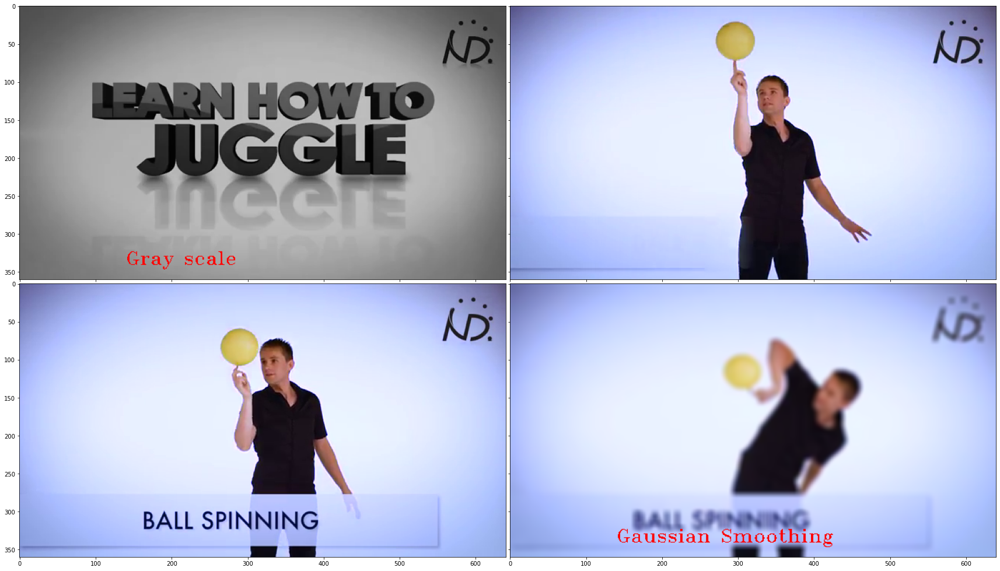

In [147]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
%matplotlib inline


fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )
i=0
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 40

plt.show()

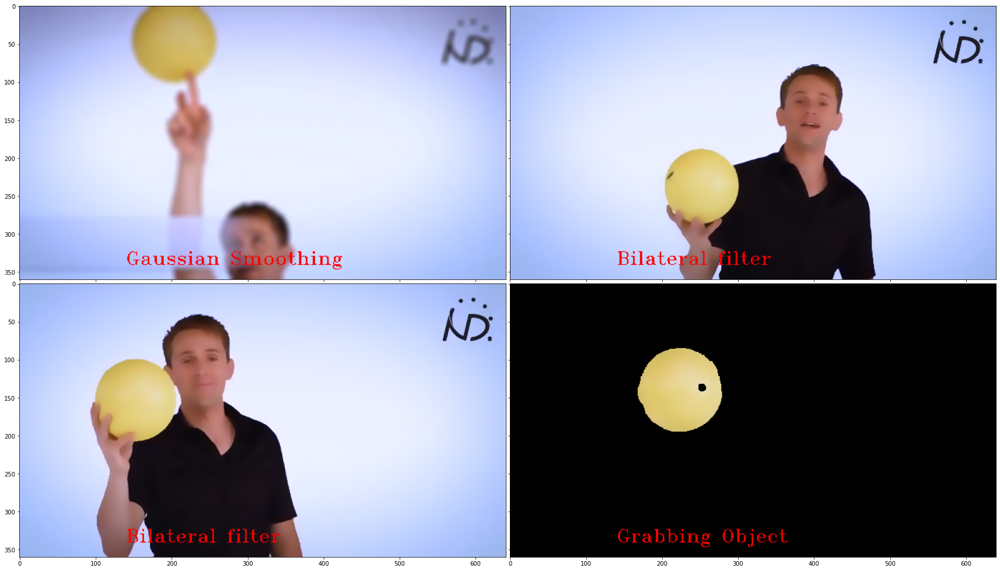

In [148]:
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 40

plt.show()

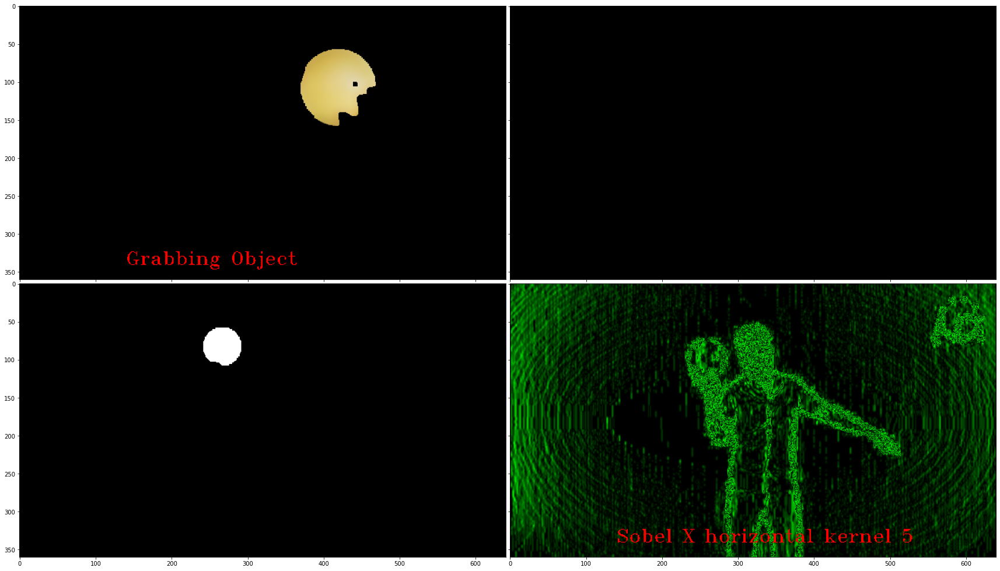

In [149]:
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 40

plt.show()

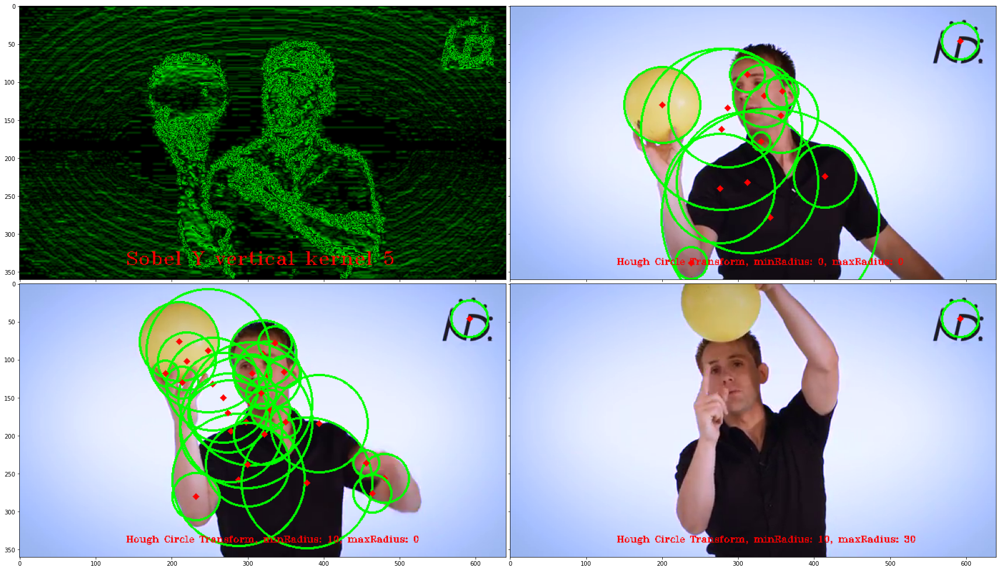

In [150]:
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 40

plt.show()

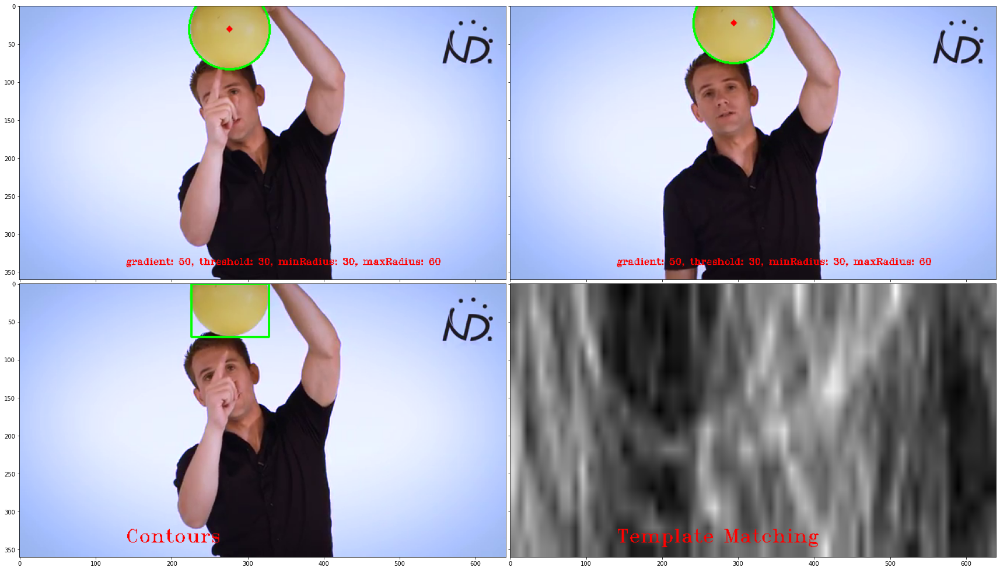

In [151]:
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 40

plt.show()

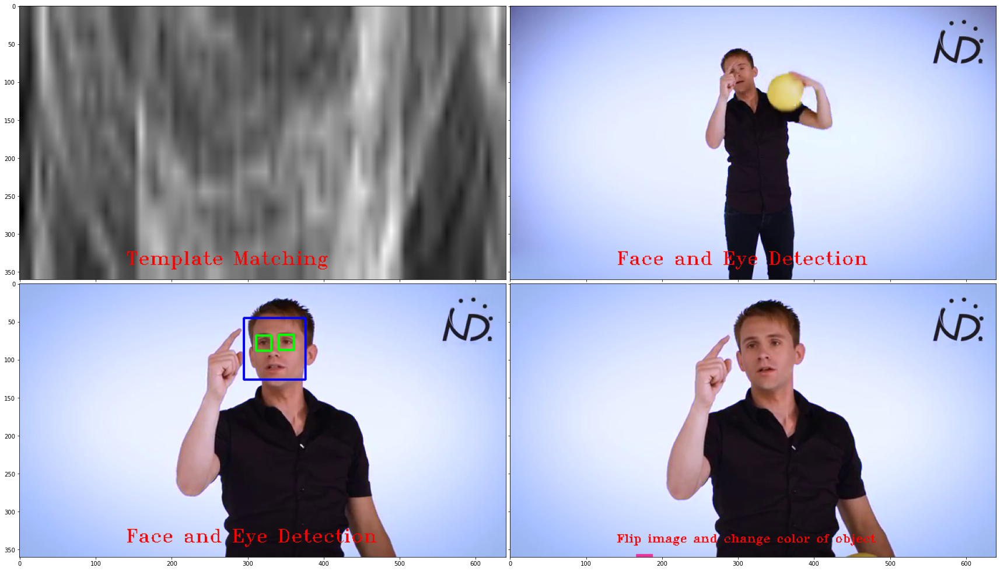

In [130]:
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 40

plt.show()

In [212]:
print(i, len(frame_array))

1168 1219


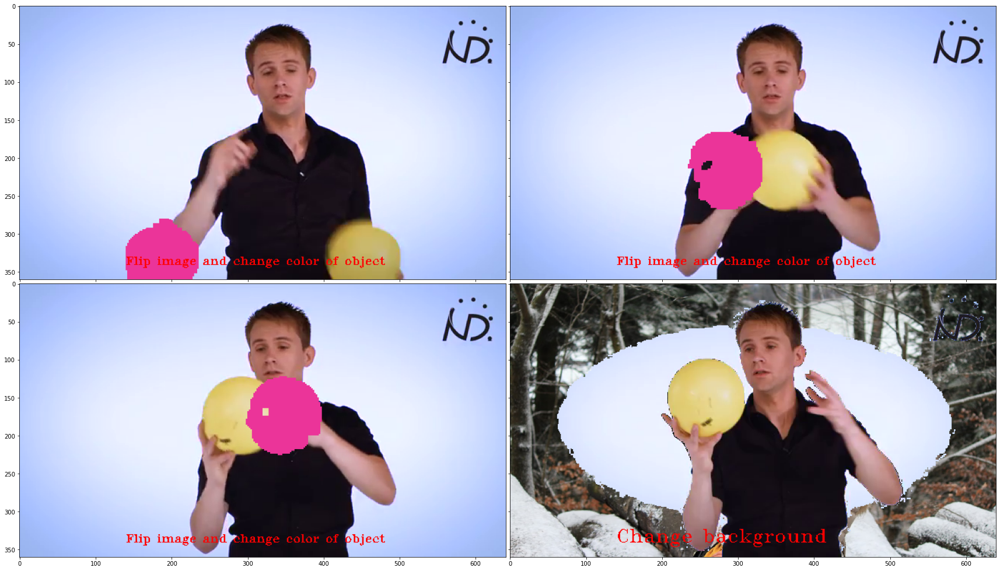

In [186]:
i = 1005
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb = cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 5

plt.show()

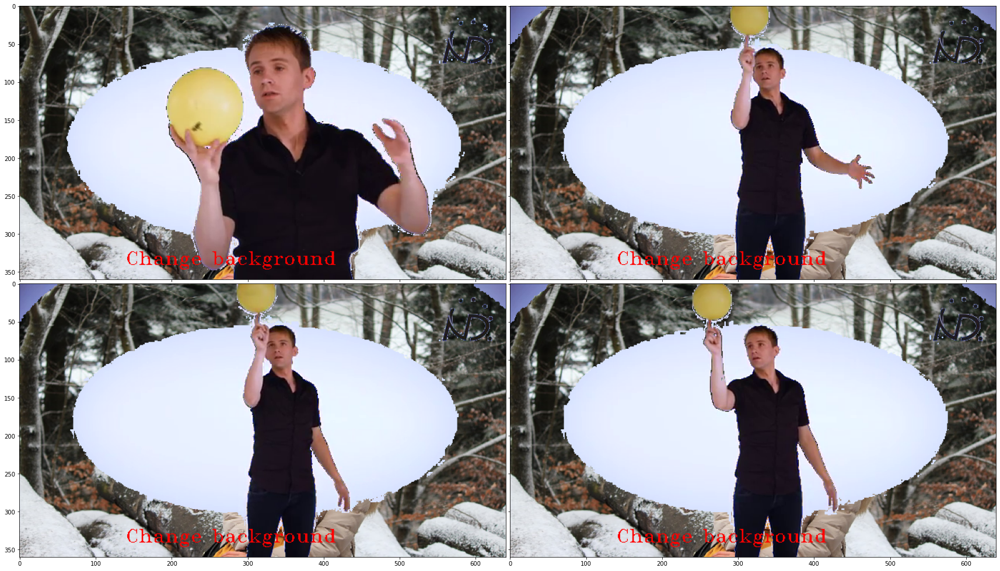

In [188]:
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    im_rgb= cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 20

plt.show()

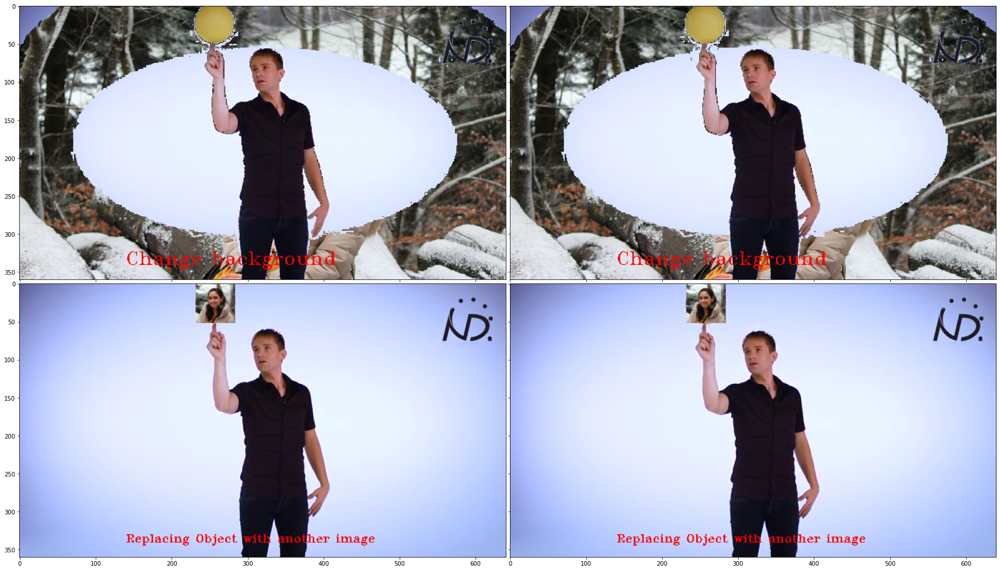

In [239]:
i = 1100
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    # print(i)
    im_rgb= cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 10

plt.show()

1178
1183
1188
1193


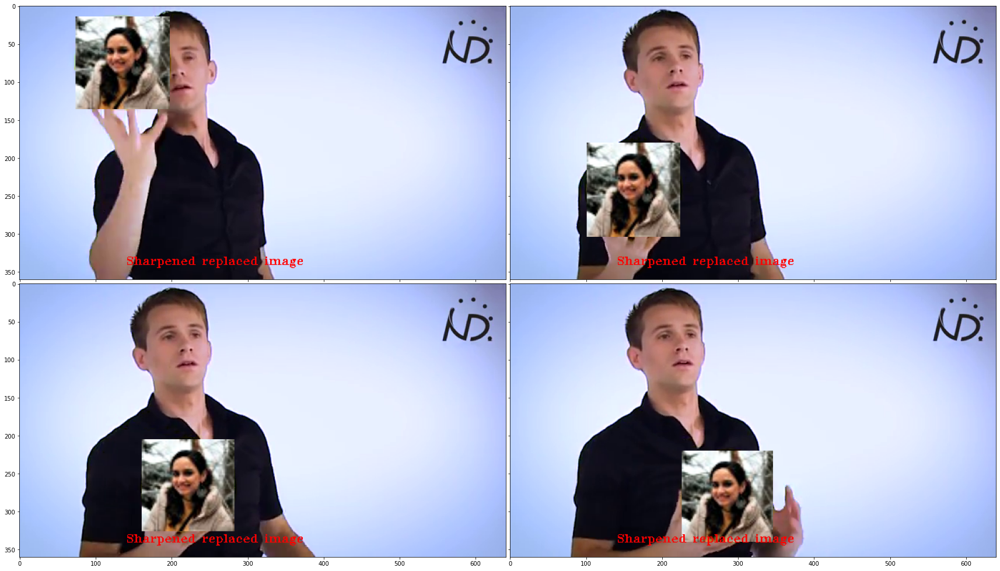

In [232]:
i = 1178
fig = plt.figure(figsize=(30., 30.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
)
max_num = 4
for ax, im in zip(grid, range(0, max_num)):
    # Iterating over the grid returns the Axes.
    print(i)
    im_rgb= cv2.cvtColor(frame_array[i], cv2.COLOR_BGR2RGB)
    # PIL_image = Image.fromarray(np.uint8(im_rgb)).convert('RGB')
    ax.imshow(im_rgb)
    i += 5

plt.show()